# **Library Import**

In [1]:
runningInColab: bool = True
basePath: str = "./drive/MyDrive" if runningInColab else "/Volumes/SanDisk/Oral_Cancer"

In [2]:
!pip install albumentations

In [3]:
!pip install efficientnet
!pip install segmentation_models
!export SM_FRAMEWORK=tf.keras

import os
os.environ["SM_FRAMEWORK"] = "tf.keras"

from tensorflow import keras
import segmentation_models as sm

SIZE_X = 512
SIZE_Y = 512
n_classes = 2

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 4.4 MB/s eta 0:00:00
  Attempting uninstall: efficientnet
    Found existing installation: efficientnet 1.1.1
    Uninstalling efficientnet-1.1.1:
      Successfully uninstalled efficientnet-1.1.1
Segmentation Models: using `tf.keras` framework.


In [4]:
from enum import Enum
import numpy as np
import cv2 as cv
import csv
import json
import numpy as np
import os
import random
import math
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras import callbacks
from matplotlib import pyplot as plt

In [5]:
from google.colab import drive

drive.mount("/content/drive/")

Mounted at /content/drive/


# **Data Retrieval**

In [6]:
from tensorflow import keras

class Dataset :
  def __init__(self, images, masks):
    if not len(np.unique(masks[0])) == 2 :
      raise Exception("mask is not binary")
    if np.unique(masks[0])[1] == 255 :
      masks = np.where(masks == 255, 1, masks)
    self.images = images
    self.raw_masks = masks
    self.masks = keras.utils.to_categorical(masks, num_classes = 2)

In [7]:
def retrieve_model_data(prefix: str):
  train_imgs = np.load(basePath + '/Oral-Segmentation/Tensors/'+ prefix +'_Train_Imgs.npy')
  train_imgs = tf.cast(train_imgs, tf.uint8)
  test_imgs = np.load(basePath + '/Oral-Segmentation/Tensors/'+ prefix +'_Test_Imgs.npy')
  test_imgs = tf.cast(test_imgs, tf.uint8)

  train_masks = np.load(basePath + '/Oral-Segmentation/Tensors/'+ prefix +'_Train_Masks.npy')
  train_masks = tf.cast(train_masks, tf.uint8)

  test_masks = np.load(basePath + '/Oral-Segmentation/Tensors/'+ prefix +'_Test_Masks.npy')
  test_masks = tf.cast(test_masks, tf.uint8)

  train = Dataset(train_imgs, train_masks)
  test = Dataset(test_imgs, test_masks)

  foreground_channel = train.masks[:, :, :, 1]  # Extract the foreground channel (index 1)
  background_channel = train.masks[:, :, :, 0]

  print(train.masks.shape)

  print(np.unique(foreground_channel))
  print(np.count_nonzero(foreground_channel)/np.count_nonzero(background_channel))

  return train, test

In [8]:
from google.colab.patches import cv2_imshow

def show_mask_img_pair(img, mask):
    print(img.shape)
    segmented_image = cv.bitwise_and(img, img, mask=mask.squeeze().astype(np.uint8))
    cv2_imshow(segmented_image)
    plt.imshow(mask)

    plt.axis('off')
    plt.show()

# **Data Augmentation**

In [9]:
import numpy as np
import albumentations as A
from tensorflow.keras.utils import Sequence
import keras
import segmentation_models as sm

class AugmentedDataGenerator(Sequence):
  def __init__(self, images, masks, batch_size, img_size, augmentations=None, preprocess_function=None, num_classes=2, shuffle=True):
      print("hello there")

      self.images = images
      self.masks = masks
      self.batch_size = batch_size
      self.img_size = img_size
      self.augmentations = augmentations
      self.preprocess_function = preprocess_function  # Preprocessing function
      self.num_classes = num_classes  # Number of classes for one-hot encoding
      self.shuffle = shuffle
      self.indices = np.arange(len(self.images))

  def __len__(self):
      """Return the number of batches per epoch."""
      return int(np.floor(len(self.images) / self.batch_size))

  def on_epoch_end(self):
      """Shuffle the indices after each epoch."""
      if self.shuffle:
          np.random.shuffle(self.indices)

  def __getitem__(self, index):
    """Generate one batch of data."""
    # Get the batch indices
    batch_indices = self.indices[index * self.batch_size:(index + 1) * self.batch_size]

    # Correct way of indexing numpy arrays
    batch_images = np.array([self.images[i] for i in batch_indices])
    batch_masks = np.array([self.masks[i] for i in batch_indices])

    # Apply preprocessing to images
    if self.preprocess_function:
        batch_images = self.preprocess_function(batch_images)

    # Apply augmentations and ensure mask is one-hot encoded
    images, masks = self.__apply_augmentations(batch_images, batch_masks)

    return images, masks


  def __apply_augmentations(self, images, masks):
      """Apply augmentations to a batch of images and masks."""
      augmented_images = []
      augmented_masks = []

      for img, mask in zip(images, masks):
          # Ensure the image is in uint8 format (for albumentations)
          img = np.array(img, dtype=np.uint8)

          # Apply the augmentations
          augmented = self.augmentations(image=img, mask=mask)
          augmented_img = augmented['image']
          augmented_mask = augmented['mask']

          # Convert the binary mask to one-hot encoding (2 classes)
          augmented_mask = keras.utils.to_categorical(augmented_mask, num_classes=self.num_classes)

          augmented_images.append(augmented_img)
          augmented_masks.append(augmented_mask)

      return np.array(augmented_images, dtype=np.uint8), np.array(augmented_masks, dtype=np.float32)



/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.24 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


In [10]:
def get_augmentation_pipeline():
  """Returns an albumentations augmentation pipeline."""
  return A.Compose([
      A.HorizontalFlip(p=0.5),
      A.VerticalFlip(p=0.5),
      A.RandomRotate90(p=0.5),
      A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.1, rotate_limit=45, p=0.5, border_mode=0),  # Avoid extra images, set border_mode to 0
      A.RandomScale(scale_limit=0.2, p=0.5),
      A.GaussianBlur(blur_limit=(3, 7), p=0.5),
      A.Emboss(p=0.5),
      A.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1, p=0.5),
      A.RandomGamma(gamma_limit=(80, 120), p=0.5),
      A.Resize(height=512, width=512, p=1.0),  # Ensure the final image size is 512x512
    ]
  )
def create_train_generator(images, masks, batch_size, img_size, backbone_model, num_classes=2):
  """
  Creates a data generator for the U-Net model using NumPy arrays.
  Arguments:
  - images: NumPy array of shape (N, H, W, C)
  - masks: NumPy array of shape (N, H, W) containing binary masks
  - batch_size: Integer, batch size for training
  - img_size: Integer, the target image size (height and width)
  - num_classes: Integer, number of classes in the segmentation mask (default is 2 for binary segmentation)
  """
  augmentations = get_augmentation_pipeline()

  print(backbone_model)

  # Create and return the augmented data generator
  return AugmentedDataGenerator(
    images=images,
    masks=masks,
    batch_size=batch_size,
    img_size=img_size,
    augmentations=augmentations,
    num_classes=num_classes,
    preprocess_function=sm.get_preprocessing(backbone_model),
    shuffle=True
  )

# **Augmentation Testing**

In [11]:
def test_augmentation_on_single_pair(img, mask, augmentations):
    # Apply augmentations
    augmented = augmentations(image=img, mask=mask)
    augmented_img = augmented['image']
    augmented_mask = augmented['mask']

    # Convert the augmented binary mask to one-hot encoding if needed
    augmented_mask = keras.utils.to_categorical(augmented_mask, num_classes=2)

    return augmented_img, augmented_mask

In [12]:
img = train.images[1]
mask = np.array(train.raw_masks[1])

NameError: name 'train' is not defined

In [ ]:
print(mask.shape)

In [ ]:
augmentations = get_augmentation_pipeline()

augmented_img, augmented_mask = test_augmentation_on_single_pair(img, mask, augmentations)

mask_class = np.argmax(augmented_mask, axis=-1)

# Visualizing the mask
plt.imshow(mask_class, cmap='gray')
plt.title("Augmented Mask")
plt.axis('off')  # Hide axes
plt.show()

cv2_imshow(img)
cv2_imshow(augmented_img)
cv2_imshow(overlay_mask_on_image(augmented_img, mask_class))

In [ ]:
print(augmented_img.shape)

In [ ]:
print(augmented_mask.shape)

In [ ]:
cv2_imshow(augmented_img)

In [ ]:
def my_image_mask_generator(data: Dataset):
  image_generator, mask_generator = data_augmentation(data)
  train_generator = zip(image_generator, mask_generator)

  for (img, mask) in train_generator :
      yield (img, mask)

# **Backbone U-Net Architecture**

In [11]:
from tensorflow.keras.optimizers import Adam

class BacboneUNet :
  def __init__(self, name: str, backbone: str, activation, learning_rate: int, log: bool = False, encoder_freeze: bool = False, decoder_filters=(256, 128, 64, 32, 16)):
    optimizer = Adam(learning_rate)
    total_loss = sm.losses.DiceLoss(class_weights=np.array([0.01, 0.99])) + (1 * sm.losses.CategoricalFocalLoss())
    metrics = [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5)]

    self.name = name
    self.preprocess_function = sm.get_preprocessing(backbone)

    self.model = sm.Unet(
      backbone,
      encoder_weights = 'imagenet',
      classes = 2,
      activation = activation,
      encoder_freeze = encoder_freeze,
      decoder_filters = decoder_filters
    )
    self.model.compile(optimizer, total_loss, metrics=metrics)

    if log : print(self.model.summary())

  def train(self, train: Dataset, test: Dataset):
    callback_funcs = [
      callbacks.TensorBoard(
        log_dir = basePath + "/Oral-Segmentation/logs_lr_change",
        write_graph=True
      )
    ]

    test.images = self.preprocess_function(test.images)

    results = self.model.fit(
      train.images,
      train.masks,
      batch_size=8,
      epochs=25,
      verbose=1,
      validation_data = (test.images, test.masks),
      callbacks = callback_funcs,
    )

    return results

  def train_generator(self, train: AugmentedDataGenerator, test: Dataset):
    callback_funcs = [
      callbacks.TensorBoard(
        log_dir = basePath + "/Oral-Segmentation/logs_lr_change",
        write_graph=True
      )
    ]

    test.images = self.preprocess_function(test.images)

    results = self.model.fit(
      train,
      epochs=25,
      verbose=1,
      validation_data = (test.images, test.masks),
      callbacks = callback_funcs,
    )

    return results

  def save(self):
    self.model.save(basePath + "/models/" + self.name + ".h5")
    return True

In [19]:
def display_unet_loss(results, metric = "loss"):
  loss = [x for x in results.history[metric]]
  val_loss = [x for x in results.history['val_' + metric]]
  epochs = range(1, len(loss) + 1)

  plt.plot(epochs, loss, 'y', label = 'Training ' + matric)
  plt.plot(epochs, val_loss, 'r', label = 'Validation ' + metric)
  plt.title('Training and validation ' + metric)
  plt.xlabel('Epochs')
  plt.ylabel(metric)
  plt.legend()
  plt.show()

In [13]:
print(sm.get_available_backbone_names())

['resnet18', 'resnet34', 'resnet50', 'resnet101', 'resnet152', 'seresnet18', 'seresnet34', 'seresnet50', 'seresnet101', 'seresnet152', 'seresnext50', 'seresnext101', 'senet154', 'resnext50', 'resnext101', 'vgg16', 'vgg19', 'densenet121', 'densenet169', 'densenet201', 'inceptionresnetv2', 'inceptionv3', 'mobilenet', 'mobilenetv2', 'efficientnetb0', 'efficientnetb1', 'efficientnetb2', 'efficientnetb3', 'efficientnetb4', 'efficientnetb5', 'efficientnetb6', 'efficientnetb7']


# **U-NET Architecture**

In [ ]:
def jacard_coef(y_true, y_pred):
  y_true_f = keras.backend.flatten(y_true)
  y_pred_f = keras.backend.flatten(y_pred)

  y_true_f = keras.backend.cast(y_true_f, 'float32')
  y_pred_f = keras.backend.cast(y_pred_f, 'float32')

  intersection = keras.backend.sum(y_true_f * y_pred_f)

  return (intersection + 1.0)/(keras.backend.sum(y_true_f) + keras.backend.sum(y_pred_f) - intersection + 1.0)

def jacard_loss(y_true, y_pred):
  return -jacard_coef(y_true, y_pred)

In [ ]:
print(jacard_coef(train_masks[0], train_masks[0]))

In [ ]:
def conv_block(input_image, feature_dims: int):
  c1 = layers.Conv2D(kernel_size = (3, 3), filters = feature_dims, padding = "same")(input_image)
  c1 = layers.Dropout(0.1)(c1)
  c1 = layers.Activation(activation = "relu")(c1)

  return c1

In [ ]:
def conv_layer(input_image, feature_dims: int, n_blocks: int = 2):
  input = input_image

  for i in range(n_blocks) :
      input = conv_block(input_image=input, feature_dims=feature_dims)

  return input

In [ ]:
def encode_layer(input_image, feature_dims: int, n_blocks: int = 2):
  output = conv_layer(input_image=input_image, feature_dims=feature_dims, n_blocks=n_blocks)

  return output, layers.MaxPool2D((2, 2))(output)

In [ ]:
def decode_layer(input_image, skip_connection_image, feature_dims: int, n_blocks: int = 2):
  up_sample = layers.Conv2DTranspose(feature_dims, (2, 2), strides=2, padding="same")(input_image)
  concat_image = layers.Concatenate()([up_sample, skip_connection_image])
  concat_image = conv_layer(
      input_image=concat_image,
      feature_dims=feature_dims,
      n_blocks=n_blocks
  )

  return concat_image


In [ ]:
def iou_metric(y_true, y_pred):
  y_true = tf.cast(y_true, tf.float32)
  y_pred = tf.cast(y_pred > 0.5, tf.float32)

  intersection = tf.reduce_sum(y_true * y_pred)
  total = tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) - intersection

  iou = intersection / (total + tf.keras.backend.epsilon())
  return iou

In [ ]:
def build_unet(input_image_dims , stages_architecture: list[Architecture], n_bridge_features = 1024):
  inputs_image = layers.Input(input_image_dims)
  input = inputs_image
  layer_results = []

  for stage in stages_architecture :
    raw_img, downsampled_img = encode_layer(
        input_image=input,
        feature_dims=stage.features_dims,
        n_blocks=stage.conv_layers
    )

    input = downsampled_img
    layer_results.append(raw_img)

  bridge_result = conv_block(input, n_bridge_features)
  input = bridge_result

  for stage_index in range(len(stages_architecture)) :
    stage = stages_architecture[::-1][stage_index]

    input = decode_layer(
        input_image=input,
        skip_connection_image=layer_results[::-1][stage_index],
        feature_dims=stage.features_dims,
        n_blocks=stage.conv_layers
    )

  output = layers.Conv2D(1, 1, padding="same", activation="sigmoid")(input)

  return keras.Model(
    inputs=inputs_image,
    outputs=output,
    name = "U-Net"
  )

# **U-Net training**

In [ ]:
# Optimzing the meta data
from keras.callbacks import LearningRateScheduler
from tensorflow.keras.optimizers import SGD

epochs = 50
learning_rate = 0.01
decay_rate = learning_rate / epochs
momentum = 0.8

def decay(epoch):
  return learning_rate

np.random.seed(42)

gradient_descent_optimization = SGD(
    learning_rate = learning_rate,
    momentum = momentum,
    decay = decay_rate,
    nesterov = False
)

lr_rate = LearningRateScheduler(decay)


/usr/local/lib/python3.10/dist-packages/keras/src/optimizers/base_optimizer.py:33: UserWarning: Argument `decay` is no longer supported and will be ignored.
  warnings.warn(


In [ ]:
from tensorflow.keras.optimizers import Adam

model = build_unet(
  (512, 512, 3),
  [
    Architecture(2, pow(2, 5 + i)) for i in range(3)
  ]
)

optimizer = Adam(learning_rate=1e-4)
model.compile(optimizer = optimizer, loss=jacard_loss, metrics=[jacard_coef])
model.summary()

model_checkpoint = callbacks.ModelCheckpoint('lesion_segmentation.keras', verbose=True, save_best_only=True)

callback_funcs = [
  callbacks.TensorBoard(
    log_dir = basePath + "/Oral-Segmentation/logs_lr_change",
    write_graph=True
  ),
  lr_rate
]

Model: "U-Net"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4             │ (None, 512, 512, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_56 (Conv2D)        │ (None, 512, 512, 32)   │            896 │ input_layer_4[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_52 (Dropout)      │ (None, 512, 512, 32)   │              0 │ conv2d_56[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_52             │ (None, 512, 512, 32)   │              0 │ dropout_52[0][0]       │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_57 (Conv2D)        │ (None, 512, 512, 32)   │          9,248 │ activation_52[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_53 (Dropout)      │ (None, 512, 512, 32)   │              0 │ conv2d_57[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_53             │ (None, 512, 512, 32)   │              0 │ dropout_53[0][0]       │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_12          │ (None, 256, 256, 32)   │              0 │ activation_53[0][0]    │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_58 (Conv2D)        │ (None, 256, 256, 64)   │         18,496 │ max_pooling2d_12[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_54 (Dropout)      │ (None, 256, 256, 64)   │              0 │ conv2d_58[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_54             │ (None, 256, 256, 64)   │              0 │ dropout_54[0][0]       │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_59 (Conv2D)        │ (None, 256, 256, 64)   │         36,928 │ activation_54[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_55 (Dropout)      │ (None, 256, 256, 64)   │              0 │ conv2d_59[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_55             │ (None, 256, 256, 64)   │              0 │ dropout_55[0][0]       │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_13          │ (None, 128, 128, 64)   │              0 │ activation_55[0][0]    │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_60 (Conv2D)        │ (None, 128, 128, 128)  │         73,856 │ max_pooling2d_13[0][0] │
├──────────────────────

 Total params: 2,614,241 (9.97 MB)

 Trainable params: 2,614,241 (9.97 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
gpu_devices = tf.config.list_physical_devices('GPU')
if gpu_devices:
    print("GPUs are available:", gpu_devices)
else:
    print("No GPUs detected. TensorFlow will use the CPU.")

GPUs are available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [ ]:
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'

results = model.fit(
  x = train_imgs,
  y = train_masks,
  validation_split=0.1,
  batch_size=25,
  epochs=25,
  callbacks=callback_funcs,
  verbose=1
)

model.save_weights(basePath + '/Oral-Segmentation/oral-segentation.weights.h5')

Epoch 1/25


ResourceExhaustedError: Graph execution error:

Detected at node StatefulPartitionedCall defined at (most recent call last):
  File "/usr/lib/python3.10/runpy.py", line 196, in _run_module_as_main

  File "/usr/lib/python3.10/runpy.py", line 86, in _run_code

  File "/usr/local/lib/python3.10/dist-packages/colab_kernel_launcher.py", line 37, in <module>

  File "/usr/local/lib/python3.10/dist-packages/traitlets/config/application.py", line 992, in launch_instance

  File "/usr/local/lib/python3.10/dist-packages/ipykernel/kernelapp.py", line 619, in start

  File "/usr/local/lib/python3.10/dist-packages/tornado/platform/asyncio.py", line 195, in start

  File "/usr/lib/python3.10/asyncio/base_events.py", line 603, in run_forever

  File "/usr/lib/python3.10/asyncio/base_events.py", line 1909, in _run_once

  File "/usr/lib/python3.10/asyncio/events.py", line 80, in _run

  File "/usr/local/lib/python3.10/dist-packages/tornado/ioloop.py", line 685, in <lambda>

  File "/usr/local/lib/python3.10/dist-packages/tornado/ioloop.py", line 738, in _run_callback

  File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 825, in inner

  File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 786, in run

  File "/usr/local/lib/python3.10/dist-packages/ipykernel/kernelbase.py", line 361, in process_one

  File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 234, in wrapper

  File "/usr/local/lib/python3.10/dist-packages/ipykernel/kernelbase.py", line 261, in dispatch_shell

  File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 234, in wrapper

  File "/usr/local/lib/python3.10/dist-packages/ipykernel/kernelbase.py", line 539, in execute_request

  File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 234, in wrapper

  File "/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py", line 302, in do_execute

  File "/usr/local/lib/python3.10/dist-packages/ipykernel/zmqshell.py", line 539, in run_cell

  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 2975, in run_cell

  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3030, in _run_cell

  File "/usr/local/lib/python3.10/dist-packages/IPython/core/async_helpers.py", line 78, in _pseudo_sync_runner

  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3257, in run_cell_async

  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3473, in run_ast_nodes

  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code

  File "<ipython-input-61-b0cf1cf2e3ef>", line 3, in <cell line: 3>

  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler

  File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/trainer.py", line 318, in fit

  File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/trainer.py", line 121, in one_step_on_iterator

Out of memory while trying to allocate 18178739592 bytes.
	 [[{{node StatefulPartitionedCall}}]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info. This isn't available when running in Eager mode.
 [Op:__inference_one_step_on_iterator_57937]

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


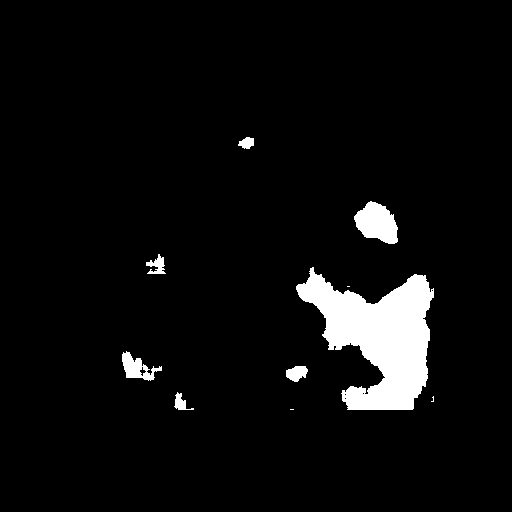

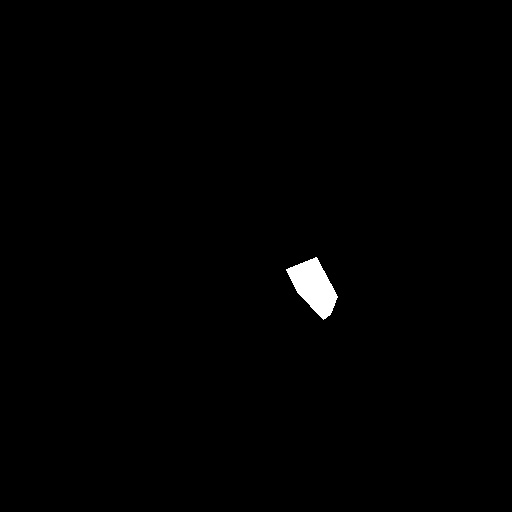

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


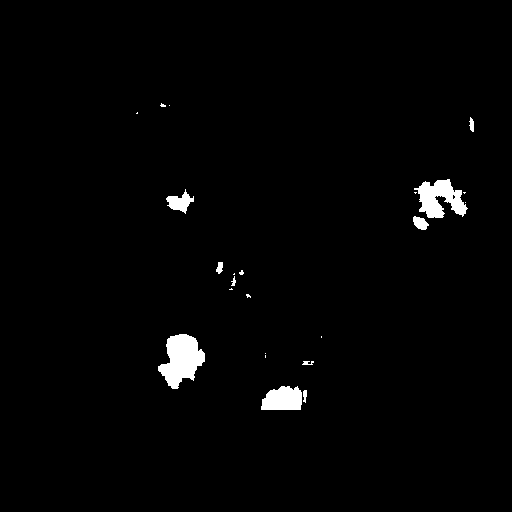

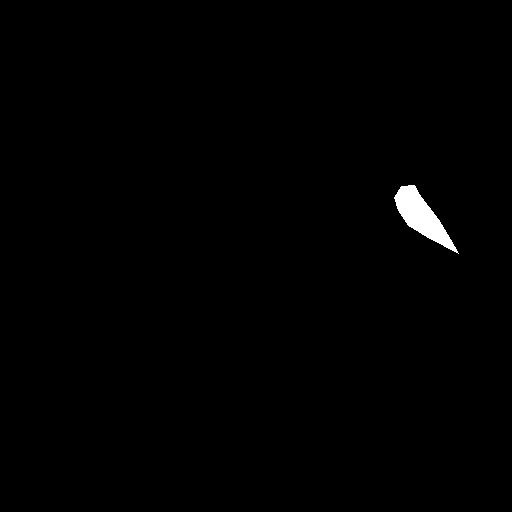

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


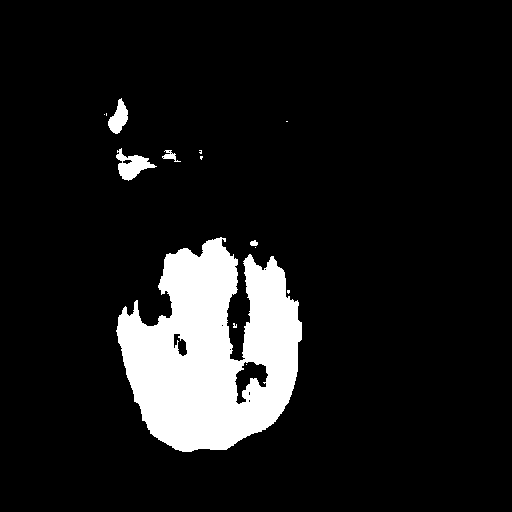

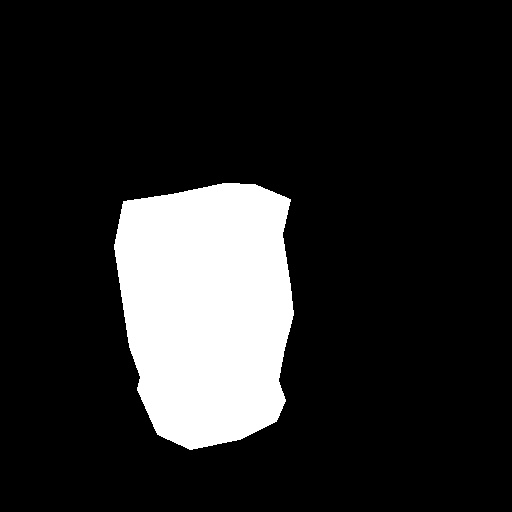

ValueError: Failed to convert a NumPy array to a Tensor (Unsupported object type NoneType).

In [ ]:
import cv2 as cv
import numpy as np

# Load the image and prepare the input format
for i in range (1, 9):
  img = cv.imread(basePath + "/Oral-Segmentation/Image/R-01-0" + str(i) + ".jpg")
  mask = cv.imread(basePath + "/Oral-Segmentation/Mask/R-01-0" + str(i) + ".jpg")
  img_input = np.expand_dims(img, axis=0)

  result = model.predict(img_input)

  # Threshold to get a binary mask
  result_binary = (result > 0.39).astype(np.uint8)

  # If result is multi-channel, select the relevant channel
  if result_binary.ndim == 4:  # (batch_size, height, width, 1) format
      result_binary = result_binary[0, :, :, 0]

  # Scale to 0-255 range for display
  result_display = (result_binary * 255).astype(np.uint8)

  # Show the result
  imshow(result_display)
  imshow(mask)


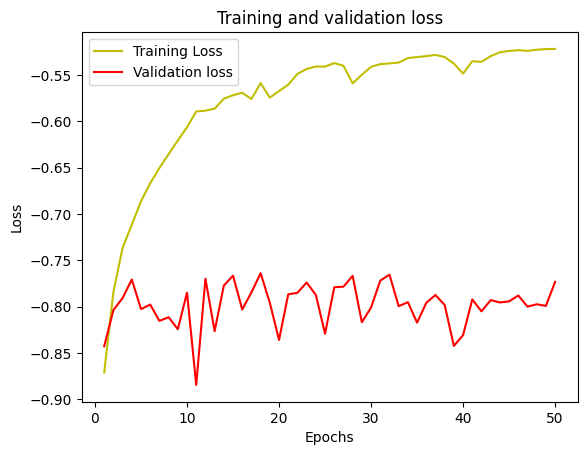

In [ ]:
import matplotlib.pyplot as plt

loss = [-x for x in history1.history['loss']]
val_loss = [-x for x in history1.history['val_loss']]
epochs = range(1, len(loss) + 1)

plt.plot(epochs, loss, 'y', label = 'Training Loss')
plt.plot(epochs, val_loss, 'r', label = 'Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

# **Backbone U-Net Training**

In [37]:
train: Dataset = Dataset(train_imgs, train_masks)
test: Dataset = Dataset(test_imgs, test_masks)

In [ ]:
print(train.images.shape)
print(train.masks.shape)

print(train.masks.dtype)
print(train.images.dtype)

(2403, 512, 512, 3)
(2403, 512, 512, 2)
float64
uint8


In [38]:
train_gen_resnet_34 = create_train_generator(train.images, train.raw_masks, 8, (512, 512), "resnet34")

resnet34
hello there


In [ ]:
images, masks = next(iter(train_gen_resnet_34))

(8, 512, 512, 3)
(8, 512, 512, 2)


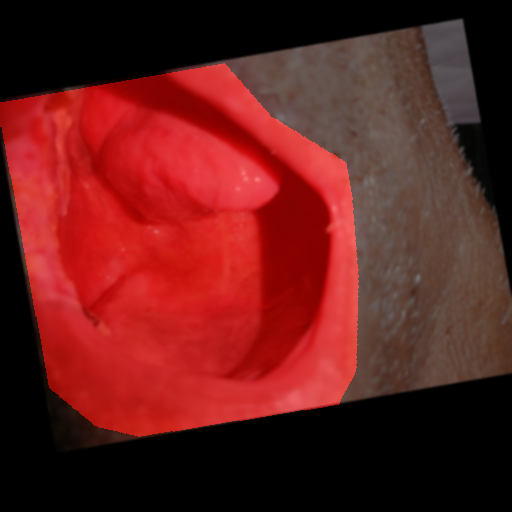

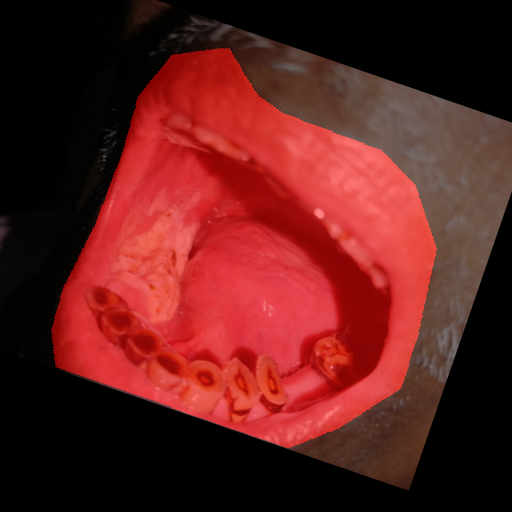

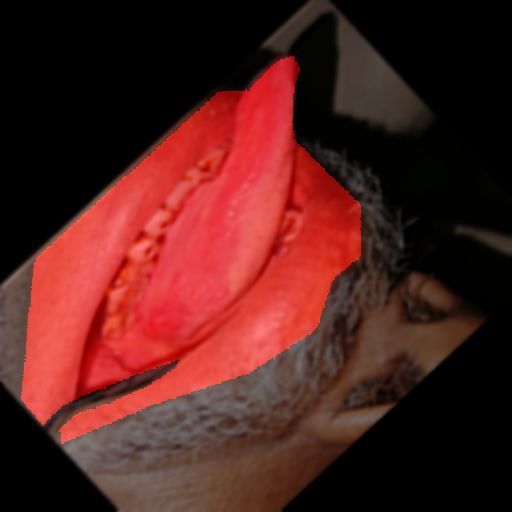

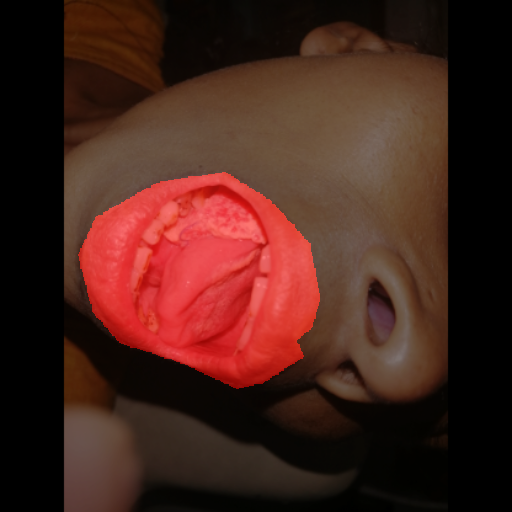

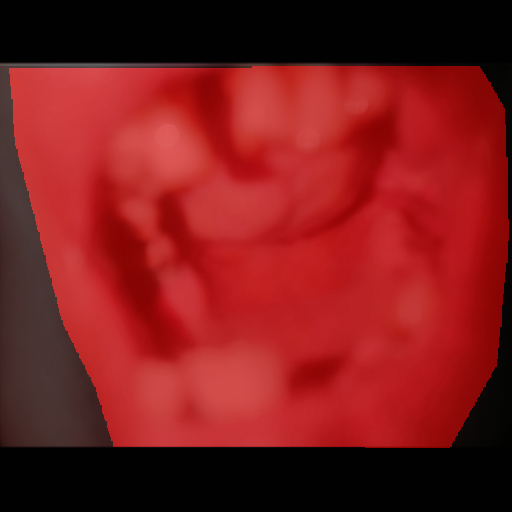

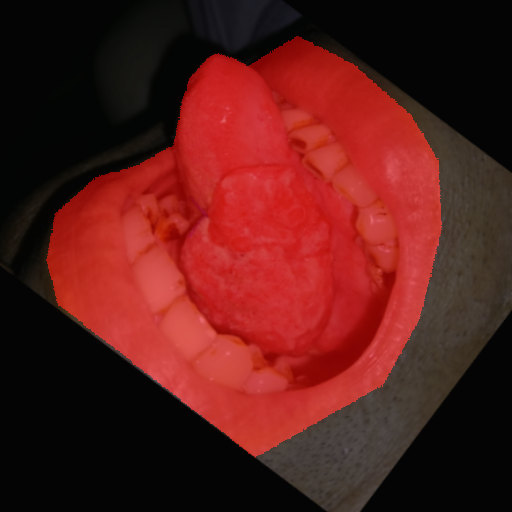

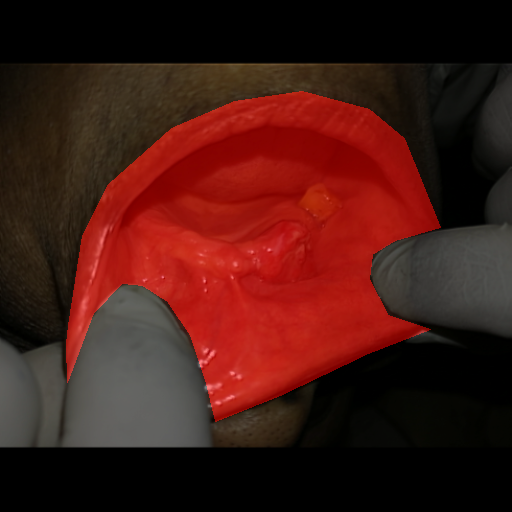

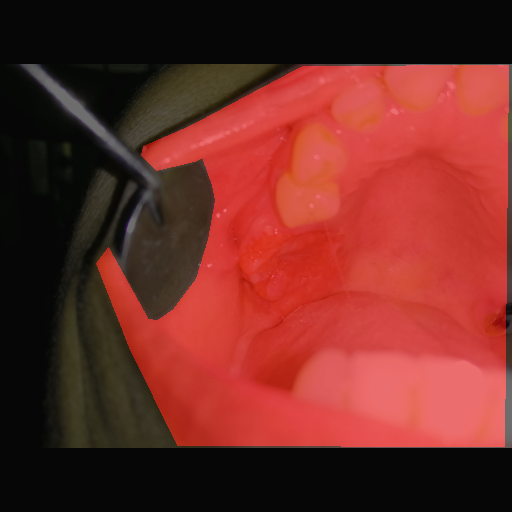

In [ ]:
print(images.shape)
print(masks.shape)

for i in range(8):
  cv2_imshow(overlay_mask_on_image(images[i], masks[i]))

In [ ]:
foreground_channel = masks[:, :, :, 1]  # Extract the foreground channel (index 1)
background_channel = masks[:, :, :, 0]

print(masks.shape)

print(np.unique(foreground_channel))
print(np.count_nonzero(foreground_channel)/np.count_nonzero(background_channel))

(8, 512, 512, 2)
[0. 1.]
0.6143735806935837


In [ ]:
foreground_channel = test.masks[:, :, :, 1]  # Extract the foreground channel (index 1)
background_channel = test.masks[:, :, :, 0]

print(test.masks.shape)

print(np.unique(foreground_channel))
print(np.count_nonzero(foreground_channel)/np.count_nonzero(background_channel))

(597, 512, 512, 2)


KeyboardInterrupt: 

In [ ]:
print(np.count_nonzero(train.raw_masks[0]))

122275


In [ ]:
train_normalized: Dataset = Dataset(train_imgs/255, train_masks)
test_normalized: Dataset = Dataset(test_imgs/255, test_masks)

In [ ]:
print(train_normalized.images.shape)
print(train_normalized.masks.shape)

(2703, 512, 512, 3)
(2703, 512, 512, 2)


In [ ]:
show_mask_img_pair(train.images[3], train.raw_masks[3].numpy())

NameError: name 'show_mask_img_pair' is not defined

In [39]:
baseUnet: BacboneUNet = BacboneUNet("baseUnet", "resnet34", "sigmoid", 0.0001, True)

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ data (InputLayer)         │ (None, None, None, 3)  │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bn_data                   │ (None, None, None, 3)  │              9 │ data[0][0]             │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d            │ (None, None, None, 3)  │              0 │ bn_data[0][0]          │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv0 (Conv2D)            │ (None, None, None, 64) │          9,408 │ zero_padding2d[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bn0 (BatchNormalization)  │ (None, None, None, 64) │            256 │ conv0[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ relu0 (Activation)        │ (None, None, None, 64) │              0 │ bn0[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d_1          │ (None, None, None, 64) │              0 │ relu0[0][0]            │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pooling0 (MaxPooling2D)   │ (None, None, None, 64) │              0 │ zero_padding2d_1[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stage1_unit1_bn1          │ (None, None, None, 64) │            256 │ pooling0[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stage1_unit1_relu1        │ (None, None, None, 64) │              0 │ stage1_unit1_bn1[0][0] │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d_2          │ (None, None, None, 64) │              0 │ stage1_unit1_relu1[0]… │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stage1_unit1_conv1        │ (None, None, None, 64) │         36,864 │ zero_padding2d_2[0][0] │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stage1_unit1_bn2          │ (None, None, None, 64) │            256 │ stage1_unit1_conv1[0]… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stage1_unit1_relu2        │ (None, None, None, 64) │              0 │ stage1_unit1_bn2[0][0] │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d_3          │ (None, None, None, 64) │              0 │ stage1_unit1_relu2[0]… │
│ (ZeroPadding2D)      

 Total params: 24,456,299 (93.29 MB)

 Trainable params: 24,438,949 (93.23 MB)

 Non-trainable params: 17,350 (67.77 KB)

None


In [40]:
for i, (images, masks) in enumerate(train_gen_resnet_34):
    print(f"Batch {i} - Image shape: {images.shape}, Mask shape: {masks.shape}")
    if i > 2:  # Only check a few batches
        break

Batch 0 - Image shape: (8, 512, 512, 3), Mask shape: (8, 512, 512, 2)
Batch 1 - Image shape: (8, 512, 512, 3), Mask shape: (8, 512, 512, 2)
Batch 2 - Image shape: (8, 512, 512, 3), Mask shape: (8, 512, 512, 2)
Batch 3 - Image shape: (8, 512, 512, 3), Mask shape: (8, 512, 512, 2)


In [41]:
results = baseUnet.train_generator(test=test, train=train_gen_resnet_34)

Epoch 1/25


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


300/300 ━━━━━━━━━━━━━━━━━━━━ 108s 172ms/step - f1-score: 0.7526 - iou_score: 0.6248 - loss: 0.6542 - val_f1-score: 0.8657 - val_iou_score: 0.7729 - val_loss: 0.5533
Epoch 2/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - f1-score: 0.8643 - iou_score: 0.7708 - loss: 0.5483 - val_f1-score: 0.8744 - val_iou_score: 0.7890 - val_loss: 0.5286
Epoch 3/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - f1-score: 0.8703 - iou_score: 0.7824 - loss: 0.5315 - val_f1-score: 0.8744 - val_iou_score: 0.7889 - val_loss: 0.5257
Epoch 4/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - f1-score: 0.8714 - iou_score: 0.7844 - loss: 0.5271 - val_f1-score: 0.8769 - val_iou_score: 0.7936 - val_loss: 0.5216
Epoch 5/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 29s 93ms/step - f1-score: 0.8763 - iou_score: 0.7923 - loss: 0.5224 - val_f1-score: 0.9235 - val_iou_score: 0.8616 - val_loss: 0.5193
Epoch 6/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - f1-score: 0.9075 - iou_score: 0.8376 - loss: 0.5213 - val_f1-score: 0.9680 - val_io

In [43]:
baseUnet.save()

True

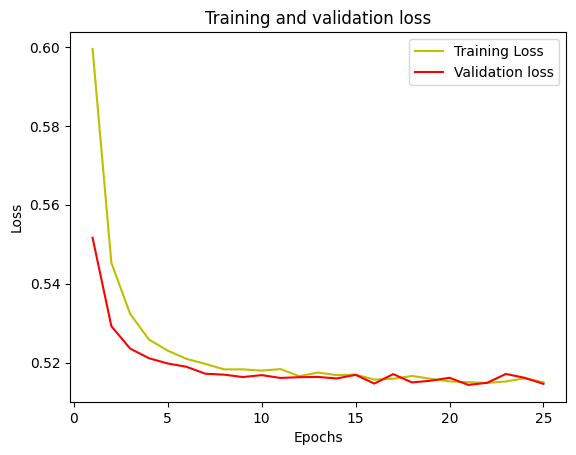

In [61]:
display_unet_loss(results)

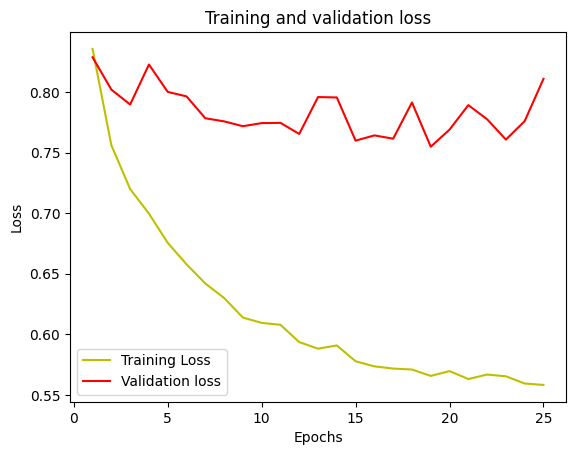

In [ ]:
display_unet_loss(results)

In [ ]:
smaller_U_net: BacboneUNet = BacboneUNet("smallerU-Net", "resnet18", "sigmoid", 0.0001, True)

44920640/44920640 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "functional_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ data (InputLayer)         │ (None, None, None, 3)  │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bn_data                   │ (None, None, None, 3)  │              9 │ data[0][0]             │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d_136        │ (None, None, None, 3)  │              0 │ bn_data[0][0]          │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv0 (Conv2D)            │ (None, None, None, 64) │          9,408 │ zero_padding2d_136[0]… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bn0 (BatchNormalization)  │ (None, None, None, 64) │            256 │ conv0[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ relu0 (Activation)        │ (None, None, None, 64) │              0 │ bn0[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d_137        │ (None, None, None, 64) │              0 │ relu0[0][0]            │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pooling0 (MaxPooling2D)   │ (None, None, None, 64) │              0 │ zero_padding2d_137[0]… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stage1_unit1_bn1          │ (None, None, None, 64) │            256 │ pooling0[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stage1_unit1_relu1        │ (None, None, None, 64) │              0 │ stage1_unit1_bn1[0][0] │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d_138        │ (None, None, None, 64) │              0 │ stage1_unit1_relu1[0]… │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stage1_unit1_conv1        │ (None, None, None, 64) │         36,864 │ zero_padding2d_138[0]… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stage1_unit1_bn2          │ (None, None, None, 64) │            256 │ stage1_unit1_conv1[0]… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stage1_unit1_relu2        │ (None, None, None, 64) │              0 │ stage1_unit1_bn2[0][0] │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d_139        │ (None, None, None, 64) │              0 │ stage1_unit1_relu2[0]… │
│ (ZeroPadding2D)      

 Total params: 14,340,715 (54.71 MB)

 Trainable params: 14,330,789 (54.67 MB)

 Non-trainable params: 9,926 (38.77 KB)

None


In [ ]:
smaller_u_net_results = smaller_U_net.train(test=test, train=train)

Epoch 1/25
338/338 ━━━━━━━━━━━━━━━━━━━━ 64s 111ms/step - f1-score: 0.6401 - iou_score: 0.5553 - loss: 0.8788 - val_f1-score: 0.6711 - val_iou_score: 0.5998 - val_loss: 0.8357
Epoch 2/25
338/338 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step - f1-score: 0.7399 - iou_score: 0.6466 - loss: 0.7790 - val_f1-score: 0.6868 - val_iou_score: 0.6152 - val_loss: 0.8030
Epoch 3/25
338/338 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step - f1-score: 0.7695 - iou_score: 0.6748 - loss: 0.7337 - val_f1-score: 0.7088 - val_iou_score: 0.6371 - val_loss: 0.7941
Epoch 4/25
338/338 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step - f1-score: 0.8000 - iou_score: 0.7068 - loss: 0.6984 - val_f1-score: 0.6711 - val_iou_score: 0.6014 - val_loss: 0.8389
Epoch 5/25
338/338 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step - f1-score: 0.8317 - iou_score: 0.7433 - loss: 0.6643 - val_f1-score: 0.6956 - val_iou_score: 0.6256 - val_loss: 0.7890
Epoch 6/25
338/338 ━━━━━━━━━━━━━━━━━━━━ 20s 60ms/step - f1-score: 0.8498 - iou_score: 0.7630 - loss: 0.6440 - val_f1-score: 0.691

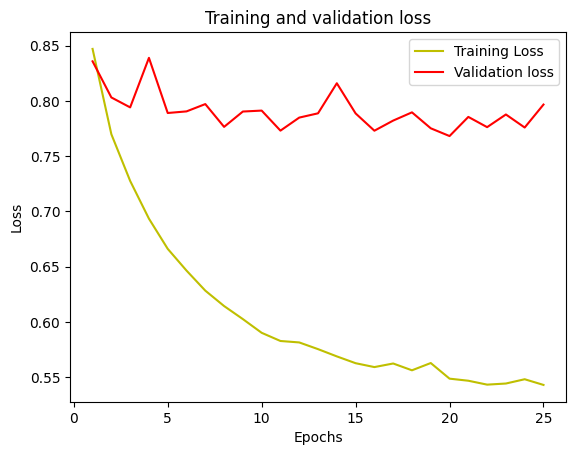

In [ ]:
display_unet_loss(smaller_u_net_results)

In [ ]:
large_u_net: BacboneUNet = BacboneUNet("smallerU-Net", "efficientnetb1", "sigmoid", 0.0001, True)

27164032/27164032 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, None, None, 3)  │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv (Conv2D)        │ (None, None, None, 32) │            864 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_bn                   │ (None, None, None, 32) │            128 │ stem_conv[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_activation           │ (None, None, None, 32) │              0 │ stem_bn[0][0]          │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_dwconv            │ (None, None, None, 32) │            288 │ stem_activation[0][0]  │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_bn                │ (None, None, None, 32) │            128 │ block1a_dwconv[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_activation        │ (None, None, None, 32) │              0 │ block1a_bn[0][0]       │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_squeeze        │ (None, 32)             │              0 │ block1a_activation[0]… │
│ (GlobalAveragePooling2D)  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reshape        │ (None, 1, 1, 32)       │              0 │ block1a_se_squeeze[0]… │
│ (Reshape)                 │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reduce         │ (None, 1, 1, 8)        │            264 │ block1a_se_reshape[0]… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_expand         │ (None, 1, 1, 32)       │            288 │ block1a_se_reduce[0][… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_excite         │ (None, None, None, 32) │              0 │ block1a_activation[0]… │
│ (Multiply)                │                        │                │ block1a_se_expand[0][… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_project_conv      │ (None, None, None, 16) │            512 │ block1a_se_excite[0][… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_project_bn        │ (None, None, None, 16) │             64 │ block1a_project_conv[… │
│ (BatchNormalization) 

 Total params: 12,641,314 (48.22 MB)

 Trainable params: 12,577,282 (47.98 MB)

 Non-trainable params: 64,032 (250.12 KB)

None


In [ ]:
large_u_net_results = large_u_net.train(test=test, train=train)

Epoch 1/25
338/338 ━━━━━━━━━━━━━━━━━━━━ 248s 368ms/step - f1-score: 0.4758 - iou_score: 0.3596 - loss: 0.9122 - val_f1-score: 0.6844 - val_iou_score: 0.6132 - val_loss: 0.8288
Epoch 2/25
338/338 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - f1-score: 0.7614 - iou_score: 0.6689 - loss: 0.7622 - val_f1-score: 0.7184 - val_iou_score: 0.6491 - val_loss: 0.7881
Epoch 3/25
338/338 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - f1-score: 0.7995 - iou_score: 0.7070 - loss: 0.7041 - val_f1-score: 0.7298 - val_iou_score: 0.6581 - val_loss: 0.7727
Epoch 4/25
338/338 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - f1-score: 0.8137 - iou_score: 0.7228 - loss: 0.6841 - val_f1-score: 0.7419 - val_iou_score: 0.6739 - val_loss: 0.7877
Epoch 5/25
338/338 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - f1-score: 0.8261 - iou_score: 0.7377 - loss: 0.6700 - val_f1-score: 0.7412 - val_iou_score: 0.6703 - val_loss: 0.7743
Epoch 6/25
338/338 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - f1-score: 0.8506 - iou_score: 0.7658 - loss: 0.6426 - val_f1-score:

In [60]:
display_unet_loss(large_u_net_results)

NameError: name 'large_u_net_results' is not defined

In [ ]:
print(np.unique(train_normalized.images[0]))
print(np.unique(train.images[0]))

[0.         0.00392157 0.00784314 0.01176471 0.01568627 0.01960784
 0.02352941 0.02745098 0.03137255 0.03529412 0.03921569 0.04313725
 0.04705882 0.05098039 0.05490196 0.05882353 0.0627451  0.06666667
 0.07058824 0.0745098  0.07843137 0.08235294 0.08627451 0.09019608
 0.09411765 0.09803922 0.10196078 0.10588235 0.10980392 0.11372549
 0.11764706 0.12156863 0.1254902  0.12941176 0.13333333 0.1372549
 0.14117647 0.14509804 0.14901961 0.15294118 0.15686275 0.16078431
 0.16470588 0.16862745 0.17254902 0.17647059 0.18039216 0.18431373
 0.18823529 0.19215686 0.19607843 0.2        0.20392157 0.20784314
 0.21176471 0.21568627 0.21960784 0.22352941 0.22745098 0.23137255
 0.23529412 0.23921569 0.24313725 0.24705882 0.25098039 0.25490196
 0.25882353 0.2627451  0.26666667 0.27058824 0.2745098  0.27843137
 0.28235294 0.28627451 0.29019608 0.29411765 0.29803922 0.30196078
 0.30588235 0.30980392 0.31372549 0.31764706 0.32156863 0.3254902
 0.32941176 0.33333333 0.3372549  0.34117647 0.34509804 0.349019

In [ ]:
normalizedUnet: BacboneUNet = BacboneUNet("normalizedUnet", "resnet34", "sigmoid", 0.0001, True)

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ data (InputLayer)         │ (None, None, None, 3)  │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bn_data                   │ (None, None, None, 3)  │              9 │ data[0][0]             │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d            │ (None, None, None, 3)  │              0 │ bn_data[0][0]          │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv0 (Conv2D)            │ (None, None, None, 64) │          9,408 │ zero_padding2d[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bn0 (BatchNormalization)  │ (None, None, None, 64) │            256 │ conv0[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ relu0 (Activation)        │ (None, None, None, 64) │              0 │ bn0[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d_1          │ (None, None, None, 64) │              0 │ relu0[0][0]            │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pooling0 (MaxPooling2D)   │ (None, None, None, 64) │              0 │ zero_padding2d_1[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stage1_unit1_bn1          │ (None, None, None, 64) │            256 │ pooling0[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stage1_unit1_relu1        │ (None, None, None, 64) │              0 │ stage1_unit1_bn1[0][0] │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d_2          │ (None, None, None, 64) │              0 │ stage1_unit1_relu1[0]… │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stage1_unit1_conv1        │ (None, None, None, 64) │         36,864 │ zero_padding2d_2[0][0] │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stage1_unit1_bn2          │ (None, None, None, 64) │            256 │ stage1_unit1_conv1[0]… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stage1_unit1_relu2        │ (None, None, None, 64) │              0 │ stage1_unit1_bn2[0][0] │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d_3          │ (None, None, None, 64) │              0 │ stage1_unit1_relu2[0]… │
│ (ZeroPadding2D)      

 Total params: 24,456,299 (93.29 MB)

 Trainable params: 24,438,949 (93.23 MB)

 Non-trainable params: 17,350 (67.77 KB)

None


In [ ]:
normalized_results = normalizedUnet.train(test=test_normalized, train=train_normalized)

Epoch 1/50
338/338 ━━━━━━━━━━━━━━━━━━━━ 119s 192ms/step - f1-score: 0.5722 - iou_score: 0.4720 - loss: 0.8807 - val_f1-score: 0.5517 - val_iou_score: 0.5130 - val_loss: 0.9178
Epoch 2/50
338/338 ━━━━━━━━━━━━━━━━━━━━ 26s 77ms/step - f1-score: 0.6623 - iou_score: 0.5782 - loss: 0.8130 - val_f1-score: 0.6118 - val_iou_score: 0.5481 - val_loss: 0.8523
Epoch 3/50
338/338 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - f1-score: 0.6736 - iou_score: 0.5868 - loss: 0.7991 - val_f1-score: 0.6176 - val_iou_score: 0.5521 - val_loss: 0.8459
Epoch 4/50
338/338 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - f1-score: 0.6882 - iou_score: 0.5991 - loss: 0.7847 - val_f1-score: 0.6065 - val_iou_score: 0.5438 - val_loss: 0.8560
Epoch 5/50
338/338 ━━━━━━━━━━━━━━━━━━━━ 26s 77ms/step - f1-score: 0.7037 - iou_score: 0.6119 - loss: 0.7707 - val_f1-score: 0.6113 - val_iou_score: 0.5476 - val_loss: 0.8501
Epoch 6/50
338/338 ━━━━━━━━━━━━━━━━━━━━ 26s 77ms/step - f1-score: 0.7352 - iou_score: 0.6396 - loss: 0.7421 - val_f1-score: 0.57

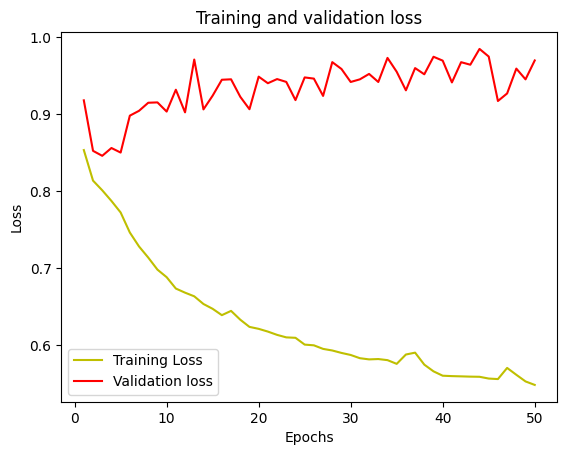

In [ ]:
display_unet_loss(normalized_results)

In [ ]:
frozenUnet: BacboneUNet = BacboneUNet("normalizedUnet", "resnet34", "sigmoid", 0.0001, True, True)

85521592/85521592 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ data (InputLayer)         │ (None, None, None, 3)  │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bn_data                   │ (None, None, None, 3)  │              9 │ data[0][0]             │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d            │ (None, None, None, 3)  │              0 │ bn_data[0][0]          │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv0 (Conv2D)            │ (None, None, None, 64) │          9,408 │ zero_padding2d[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bn0 (BatchNormalization)  │ (None, None, None, 64) │            256 │ conv0[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ relu0 (Activation)        │ (None, None, None, 64) │              0 │ bn0[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d_1          │ (None, None, None, 64) │              0 │ relu0[0][0]            │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pooling0 (MaxPooling2D)   │ (None, None, None, 64) │              0 │ zero_padding2d_1[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stage1_unit1_bn1          │ (None, None, None, 64) │            256 │ pooling0[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stage1_unit1_relu1        │ (None, None, None, 64) │              0 │ stage1_unit1_bn1[0][0] │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d_2          │ (None, None, None, 64) │              0 │ stage1_unit1_relu1[0]… │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stage1_unit1_conv1        │ (None, None, None, 64) │         36,864 │ zero_padding2d_2[0][0] │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stage1_unit1_bn2          │ (None, None, None, 64) │            256 │ stage1_unit1_conv1[0]… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stage1_unit1_relu2        │ (None, None, None, 64) │              0 │ stage1_unit1_bn2[0][0] │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d_3          │ (None, None, None, 64) │              0 │ stage1_unit1_relu2[0]… │
│ (ZeroPadding2D)      

 Total params: 24,456,299 (93.29 MB)

 Trainable params: 3,167,205 (12.08 MB)

 Non-trainable params: 21,289,094 (81.21 MB)

None


In [ ]:
frozen_results = frozenUnet.train(test=test_normalized, train=train_normalized)

Epoch 1/50
338/338 ━━━━━━━━━━━━━━━━━━━━ 107s 175ms/step - f1-score: 0.5386 - iou_score: 0.4467 - loss: 0.8995 - val_f1-score: 0.5875 - val_iou_score: 0.5312 - val_loss: 0.8817
Epoch 2/50
338/338 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - f1-score: 0.6349 - iou_score: 0.5586 - loss: 0.8383 - val_f1-score: 0.5454 - val_iou_score: 0.5038 - val_loss: 0.9137
Epoch 3/50
338/338 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - f1-score: 0.6522 - iou_score: 0.5700 - loss: 0.8175 - val_f1-score: 0.6058 - val_iou_score: 0.5440 - val_loss: 0.8527
Epoch 4/50
338/338 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - f1-score: 0.6600 - iou_score: 0.5764 - loss: 0.8090 - val_f1-score: 0.6083 - val_iou_score: 0.5460 - val_loss: 0.8510
Epoch 5/50
338/338 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - f1-score: 0.6724 - iou_score: 0.5862 - loss: 0.7974 - val_f1-score: 0.5981 - val_iou_score: 0.5384 - val_loss: 0.8651
Epoch 6/50
338/338 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - f1-score: 0.6741 - iou_score: 0.5883 - loss: 0.7957 - val_f1-score: 0.59

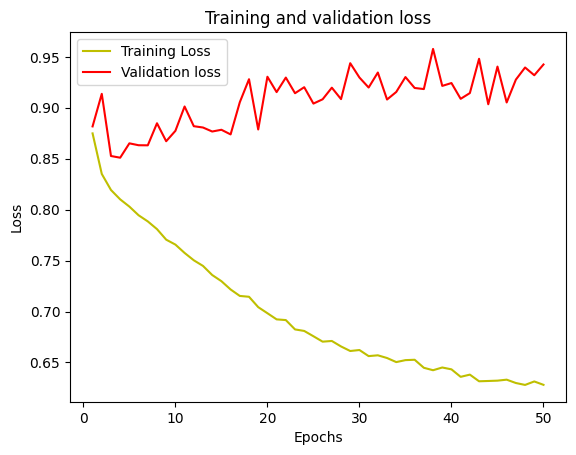

In [ ]:
display_unet_loss(frozen_results)

In [ ]:
simplifiedUnet: BacboneUNet = BacboneUNet("EfficientNet-b3", "efficientnetb3", "sigmoid", 0.0002, True, False)

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3             │ (None, None, None, 3)  │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv (Conv2D)        │ (None, None, None, 40) │          1,080 │ input_layer_3[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_bn                   │ (None, None, None, 40) │            160 │ stem_conv[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_activation           │ (None, None, None, 40) │              0 │ stem_bn[0][0]          │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_dwconv            │ (None, None, None, 40) │            360 │ stem_activation[0][0]  │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_bn                │ (None, None, None, 40) │            160 │ block1a_dwconv[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_activation        │ (None, None, None, 40) │              0 │ block1a_bn[0][0]       │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_squeeze        │ (None, 40)             │              0 │ block1a_activation[0]… │
│ (GlobalAveragePooling2D)  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reshape        │ (None, 1, 1, 40)       │              0 │ block1a_se_squeeze[0]… │
│ (Reshape)                 │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reduce         │ (None, 1, 1, 10)       │            410 │ block1a_se_reshape[0]… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_expand         │ (None, 1, 1, 40)       │            440 │ block1a_se_reduce[0][… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_excite         │ (None, None, None, 40) │              0 │ block1a_activation[0]… │
│ (Multiply)                │                        │                │ block1a_se_expand[0][… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_project_conv      │ (None, None, None, 24) │            960 │ block1a_se_excite[0][… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_project_bn   

 Total params: 17,867,978 (68.16 MB)

 Trainable params: 17,778,698 (67.82 MB)

 Non-trainable params: 89,280 (348.75 KB)

None


In [ ]:
simplified_results = simplifiedUnet.train(test=test[:1000], train=train[:1000])

TypeError: 'Dataset' object is not subscriptable

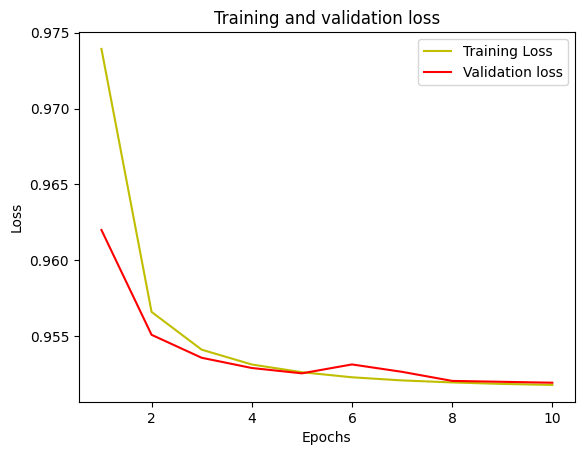

In [ ]:
display_unet_loss(simplified_results)

# **ROI Segmentaiton**

**Data Preperation**

In [14]:
from random import randint
train, test = retrieve_model_data("ROI")

(2403, 512, 512, 2)
[0. 1.]
0.5581776754690505
(512, 512, 3)


error: OpenCV(4.10.0) :-1: error: (-5:Bad argument) in function 'bitwise_and'
> Overload resolution failed:
>  - src1 is not a numpy array, neither a scalar
>  - Expected Ptr<cv::UMat> for argument 'src1'


(512, 512, 3)
(512, 512)
(512, 512, 3)


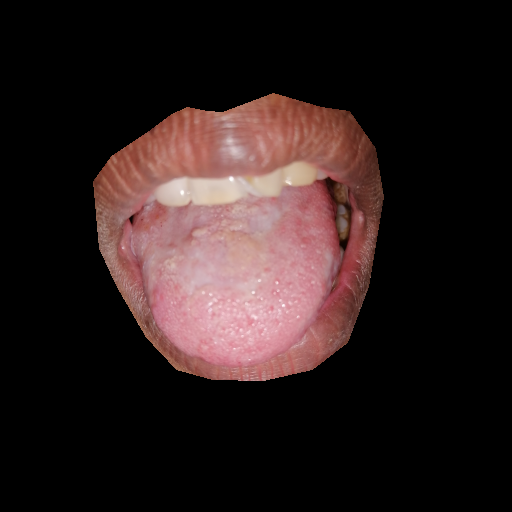

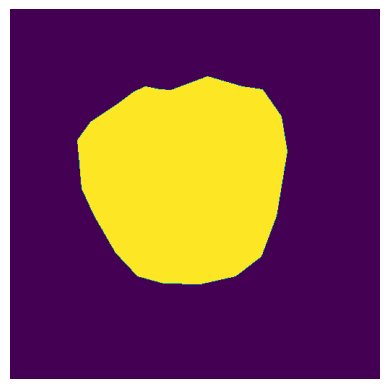

(512, 512, 3)
(512, 512)
(512, 512, 3)


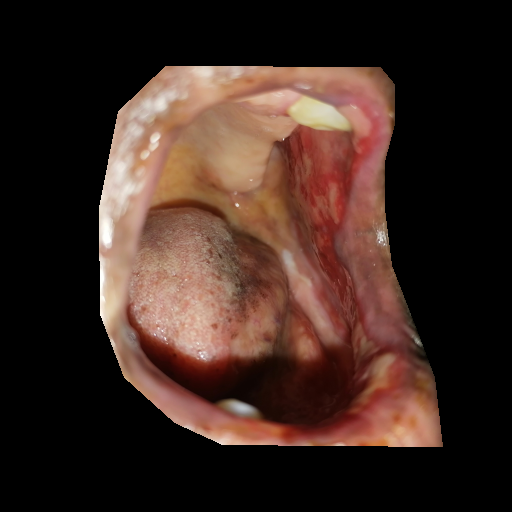

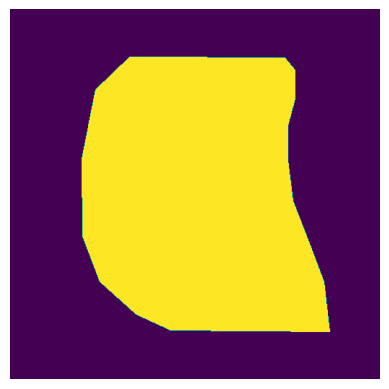

(512, 512, 3)
(512, 512)
(512, 512, 3)


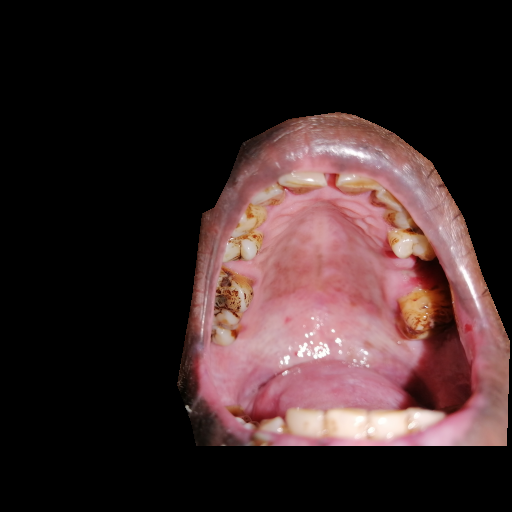

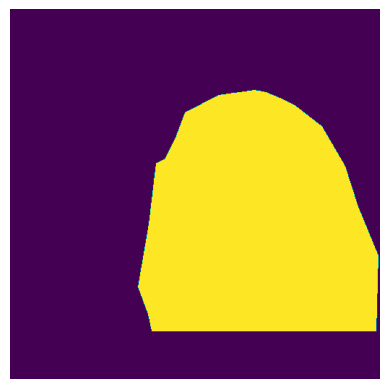

(512, 512, 3)
(512, 512)
(512, 512, 3)


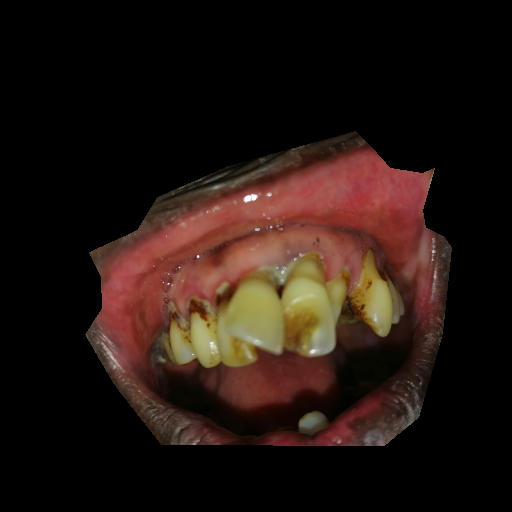

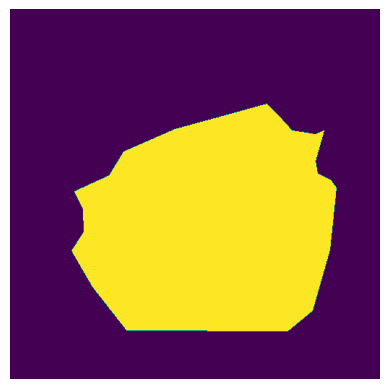

(512, 512, 3)
(512, 512)
(512, 512, 3)


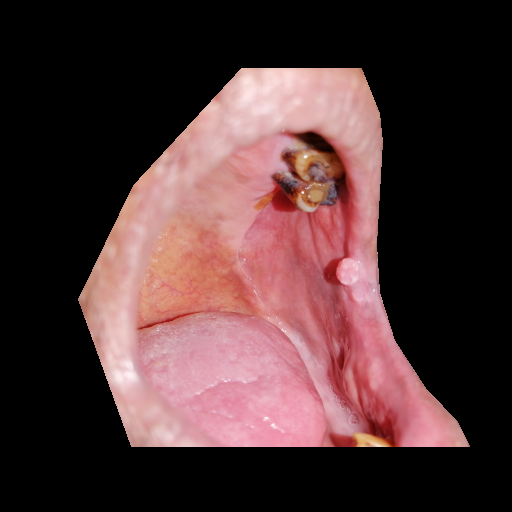

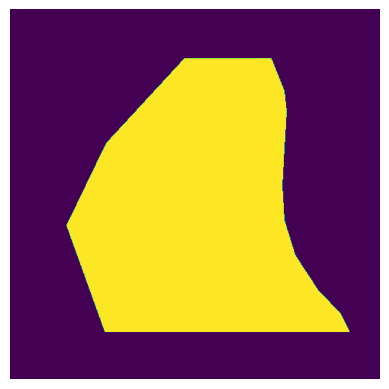

(512, 512, 3)
(512, 512)
(512, 512, 3)


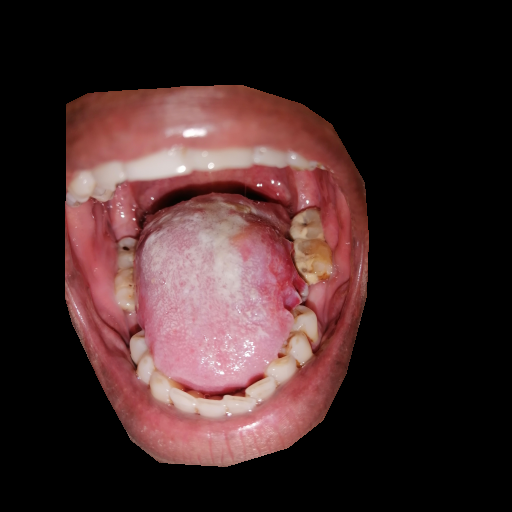

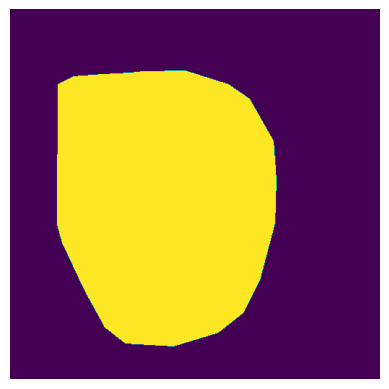

(512, 512, 3)
(512, 512)
(512, 512, 3)


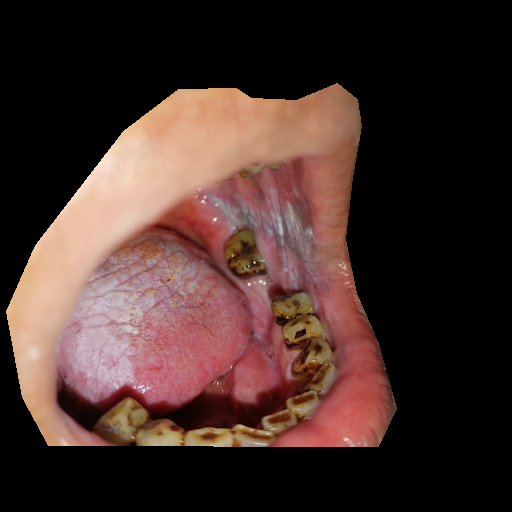

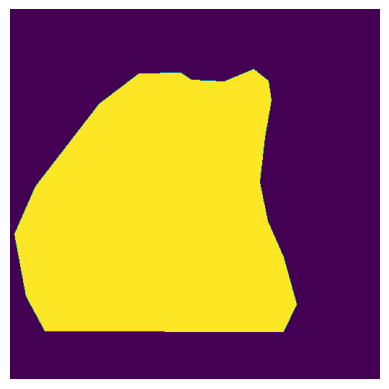

(512, 512, 3)
(512, 512)
(512, 512, 3)


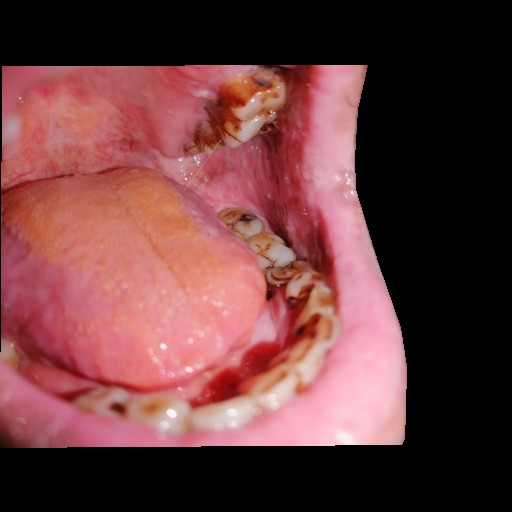

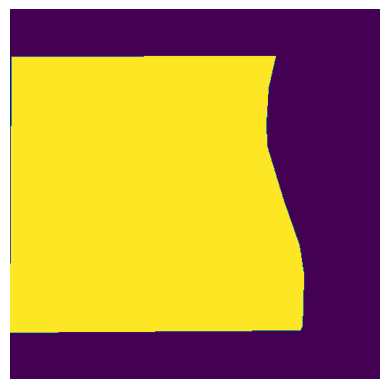

(512, 512, 3)
(512, 512)
(512, 512, 3)


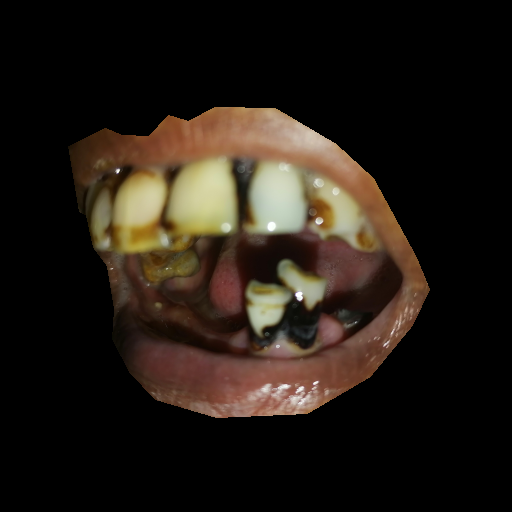

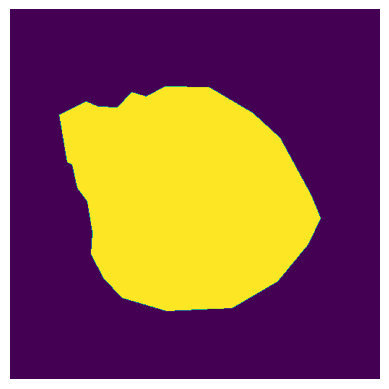

(512, 512, 3)
(512, 512)
(512, 512, 3)


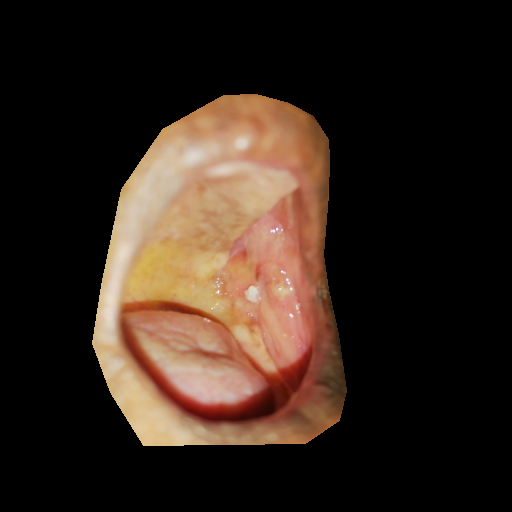

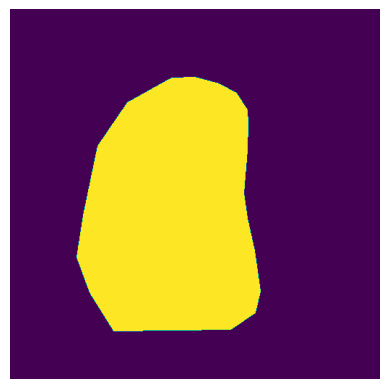

In [20]:
for i in [randint(0, len(train.images)) for k in range(0, 10)]:
  print(train.images[i].numpy().shape)
  print(train.raw_masks[i].shape)
  show_mask_img_pair(train.images[i].numpy(), train.raw_masks[i])

**RestNet 34 Model**

In [21]:
train_gen_resnet_34 = create_train_generator(train.images, train.raw_masks, 8, (512, 512), "resnet34")

resnet34
hello there


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ data (InputLayer)         │ (None, None, None, 3)  │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bn_data                   │ (None, None, None, 3)  │              9 │ data[0][0]             │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d            │ (None, None, None, 3)  │              0 │ bn_data[0][0]          │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv0 (Conv2D)            │ (None, None, None, 64) │          9,408 │ zero_padding2d[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bn0 (BatchNormalization)  │ (None, None, None, 64) │            256 │ conv0[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ relu0 (Activation)        │ (None, None, None, 64) │              0 │ bn0[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d_1          │ (None, None, None, 64) │              0 │ relu0[0][0]            │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pooling0 (MaxPooling2D)   │ (None, None, None, 64) │              0 │ zero_padding2d_1[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stage1_unit1_bn1          │ (None, None, None, 64) │            256 │ pooling0[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stage1_unit1_relu1        │ (None, None, None, 64) │              0 │ stage1_unit1_bn1[0][0] │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d_2          │ (None, None, None, 64) │              0 │ stage1_unit1_relu1[0]… │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stage1_unit1_conv1        │ (None, None, None, 64) │         36,864 │ zero_padding2d_2[0][0] │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stage1_unit1_bn2          │ (None, None, None, 64) │            256 │ stage1_unit1_conv1[0]… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stage1_unit1_relu2        │ (None, None, None, 64) │              0 │ stage1_unit1_bn2[0][0] │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d_3          │ (None, None, None, 64) │              0 │ stage1_unit1_relu2[0]… │
│ (ZeroPadding2D)      

 Total params: 24,456,299 (93.29 MB)

 Trainable params: 24,438,949 (93.23 MB)

 Non-trainable params: 17,350 (67.77 KB)

None
Epoch 1/25


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


300/300 ━━━━━━━━━━━━━━━━━━━━ 107s 174ms/step - f1-score: 0.7584 - iou_score: 0.6588 - loss: 0.6795 - val_f1-score: 0.9640 - val_iou_score: 0.9306 - val_loss: 0.5572
Epoch 2/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - f1-score: 0.9536 - iou_score: 0.9122 - loss: 0.5528 - val_f1-score: 0.8992 - val_iou_score: 0.8226 - val_loss: 0.5351
Epoch 3/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 29s 94ms/step - f1-score: 0.8859 - iou_score: 0.8050 - loss: 0.5336 - val_f1-score: 0.8794 - val_iou_score: 0.7928 - val_loss: 0.5350
Epoch 4/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - f1-score: 0.8854 - iou_score: 0.8042 - loss: 0.5281 - val_f1-score: 0.9400 - val_iou_score: 0.8885 - val_loss: 0.5210
Epoch 5/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - f1-score: 0.9300 - iou_score: 0.8744 - loss: 0.5239 - val_f1-score: 0.9639 - val_iou_score: 0.9305 - val_loss: 0.5193
Epoch 6/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - f1-score: 0.9463 - iou_score: 0.9001 - loss: 0.5216 - val_f1-score: 0.9699 - val_io

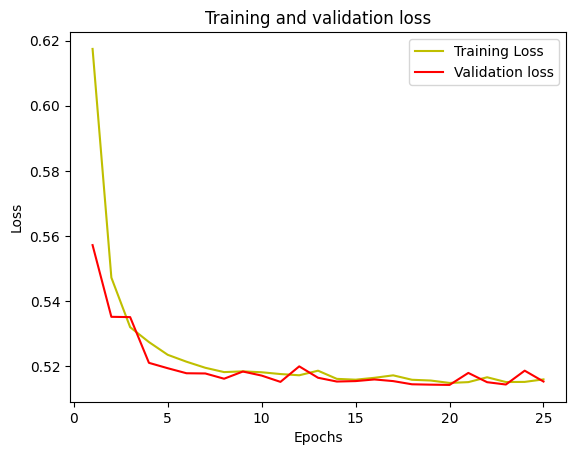

In [26]:
baseUnet: BacboneUNet = BacboneUNet("baseUnet", "resnet34", "sigmoid", 0.0001, True)
results = baseUnet.train_generator(test=test, train=train_gen_resnet_34)
display_unet_loss(results)

In [ ]:
baseUnet.save()

# **Lesion Segmentation**

**Data Preperation**

In [14]:
from random import randint
train, test = retrieve_model_data("Reduced")

(1819, 512, 512, 2)
[0. 1.]
0.1958458600423438


(512, 512, 3)
(512, 512)
(512, 512, 3)


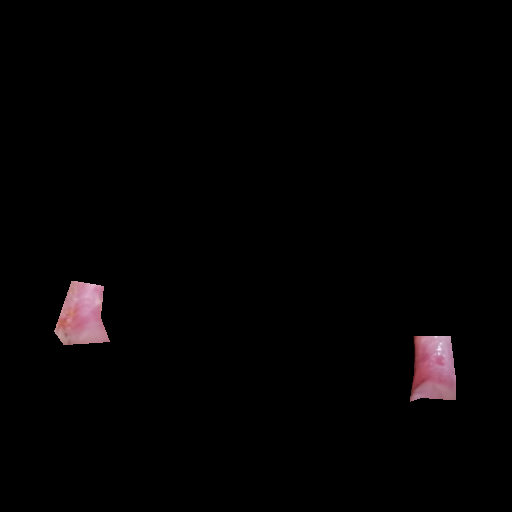

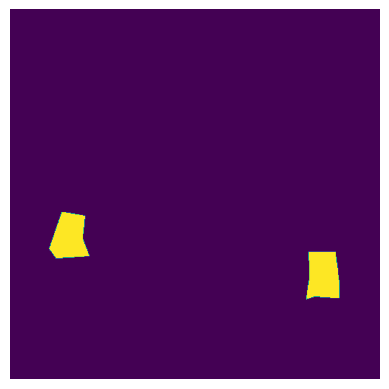

(512, 512, 3)
(512, 512)
(512, 512, 3)


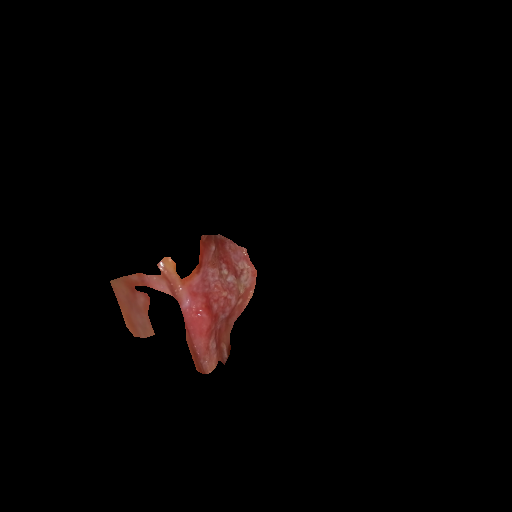

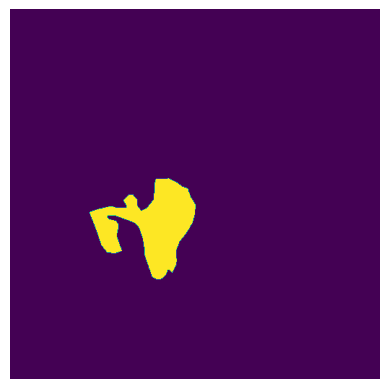

(512, 512, 3)
(512, 512)
(512, 512, 3)


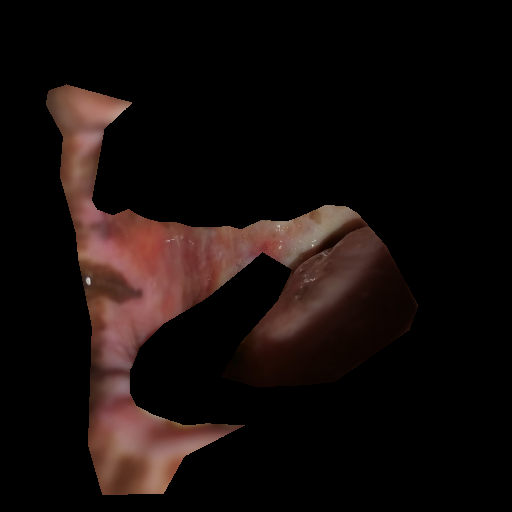

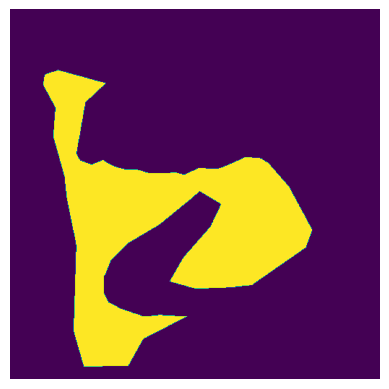

(512, 512, 3)
(512, 512)
(512, 512, 3)


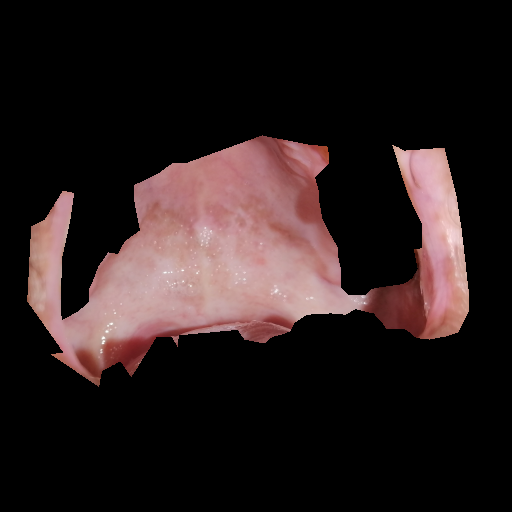

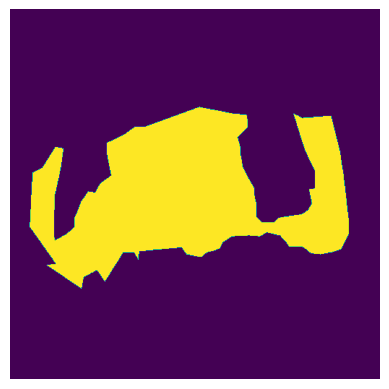

(512, 512, 3)
(512, 512)
(512, 512, 3)


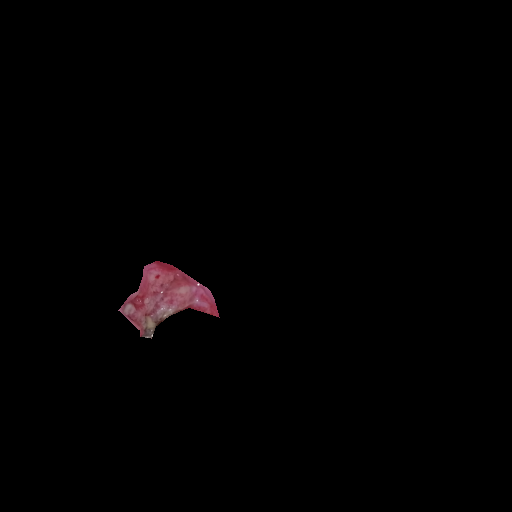

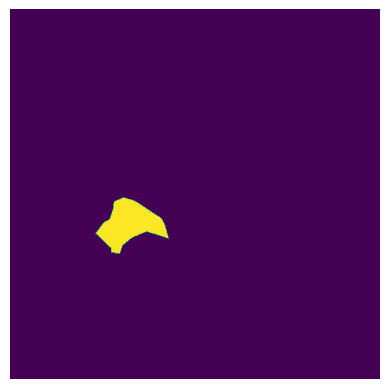

(512, 512, 3)
(512, 512)
(512, 512, 3)


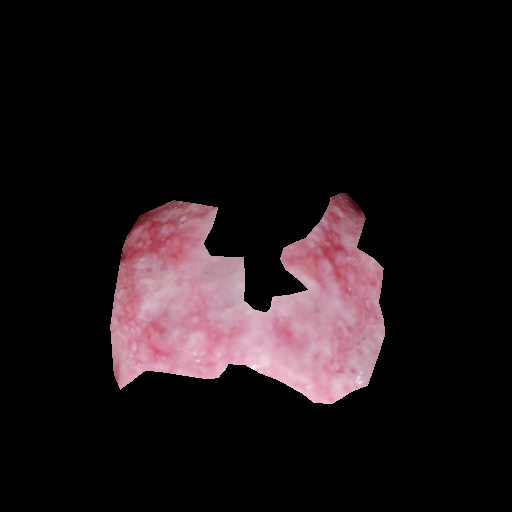

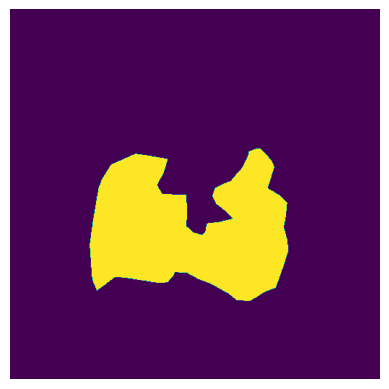

(512, 512, 3)
(512, 512)
(512, 512, 3)


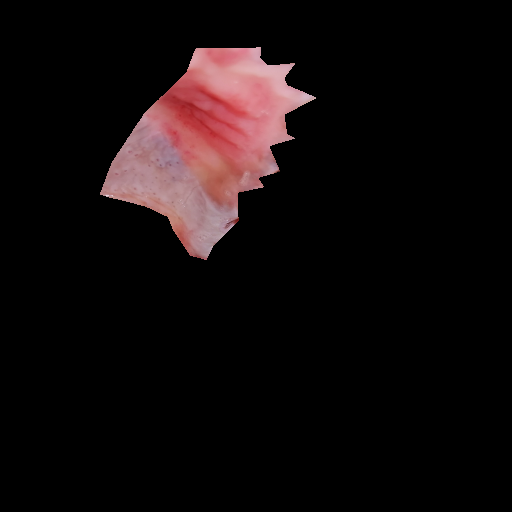

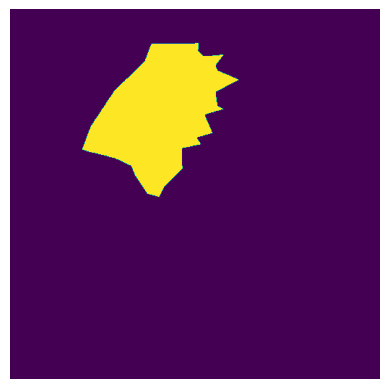

(512, 512, 3)
(512, 512)
(512, 512, 3)


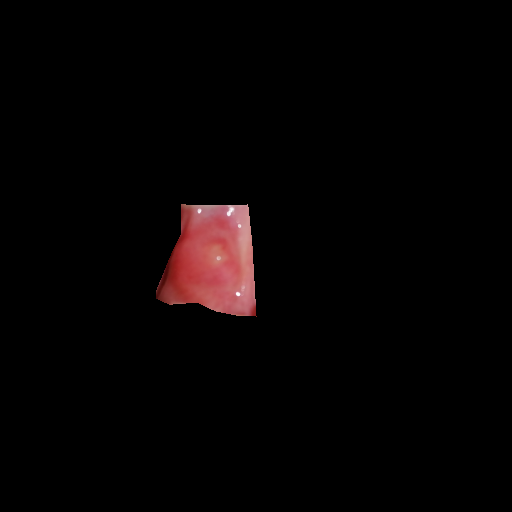

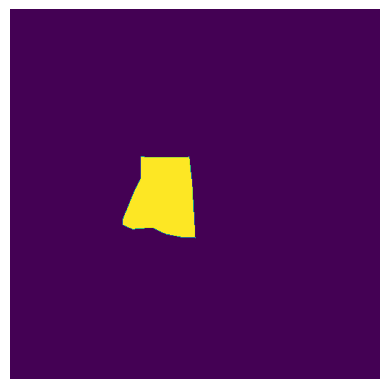

(512, 512, 3)
(512, 512)
(512, 512, 3)


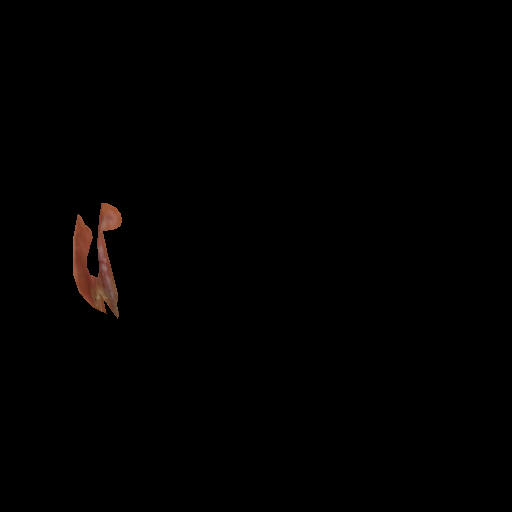

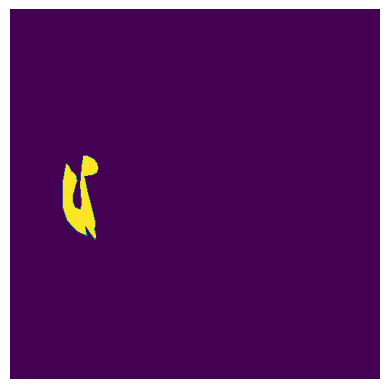

(512, 512, 3)
(512, 512)
(512, 512, 3)


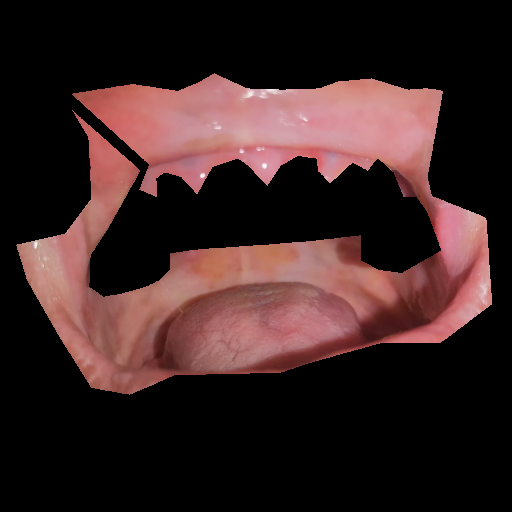

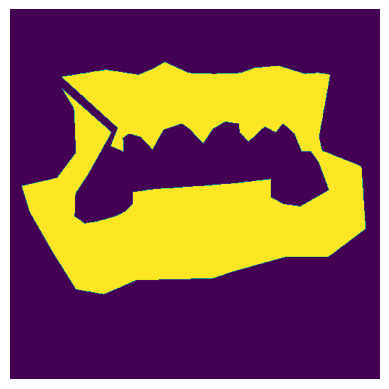

In [17]:
for i in [randint(0, len(train.images)) for k in range(0, 10)]:
  print(train.images[i].numpy().shape)
  print(train.raw_masks[i].shape)
  show_mask_img_pair(train.images[i].numpy(), train.raw_masks[i])

**ResNet 34 Model**

In [18]:
train_gen_resnet_34 = create_train_generator(train.images, train.raw_masks, 8, (512, 512), "resnet34")

resnet34
hello there


85521592/85521592 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ data (InputLayer)         │ (None, None, None, 3)  │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bn_data                   │ (None, None, None, 3)  │              9 │ data[0][0]             │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d            │ (None, None, None, 3)  │              0 │ bn_data[0][0]          │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv0 (Conv2D)            │ (None, None, None, 64) │          9,408 │ zero_padding2d[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bn0 (BatchNormalization)  │ (None, None, None, 64) │            256 │ conv0[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ relu0 (Activation)        │ (None, None, None, 64) │              0 │ bn0[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d_1          │ (None, None, None, 64) │              0 │ relu0[0][0]            │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pooling0 (MaxPooling2D)   │ (None, None, None, 64) │              0 │ zero_padding2d_1[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stage1_unit1_bn1          │ (None, None, None, 64) │            256 │ pooling0[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stage1_unit1_relu1        │ (None, None, None, 64) │              0 │ stage1_unit1_bn1[0][0] │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d_2          │ (None, None, None, 64) │              0 │ stage1_unit1_relu1[0]… │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stage1_unit1_conv1        │ (None, None, None, 64) │         36,864 │ zero_padding2d_2[0][0] │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stage1_unit1_bn2          │ (None, None, None, 64) │            256 │ stage1_unit1_conv1[0]… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stage1_unit1_relu2        │ (None, None, None, 64) │              0 │ stage1_unit1_bn2[0][0] │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d_3          │ (None, None, None, 64) │              0 │ stage1_unit1_relu2[0]… │
│ (ZeroPadding2D)      

 Total params: 24,456,299 (93.29 MB)

 Trainable params: 24,438,949 (93.23 MB)

 Non-trainable params: 17,350 (67.77 KB)

None
Epoch 1/25


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


227/227 ━━━━━━━━━━━━━━━━━━━━ 97s 179ms/step - f1-score: 0.6380 - iou_score: 0.5125 - loss: 0.8350 - val_f1-score: 0.7475 - val_iou_score: 0.6292 - val_loss: 0.7591
Epoch 2/25
227/227 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - f1-score: 0.7300 - iou_score: 0.6128 - loss: 0.7554 - val_f1-score: 0.7524 - val_iou_score: 0.6332 - val_loss: 0.7309
Epoch 3/25
227/227 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - f1-score: 0.7470 - iou_score: 0.6280 - loss: 0.7268 - val_f1-score: 0.7607 - val_iou_score: 0.6421 - val_loss: 0.7188
Epoch 4/25
227/227 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - f1-score: 0.7506 - iou_score: 0.6328 - loss: 0.7216 - val_f1-score: 0.7796 - val_iou_score: 0.6620 - val_loss: 0.7000
Epoch 5/25
227/227 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - f1-score: 0.7584 - iou_score: 0.6416 - loss: 0.7139 - val_f1-score: 0.7727 - val_iou_score: 0.6537 - val_loss: 0.7051
Epoch 6/25
227/227 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - f1-score: 0.7611 - iou_score: 0.6451 - loss: 0.7114 - val_f1-score: 0.7767 - val_iou

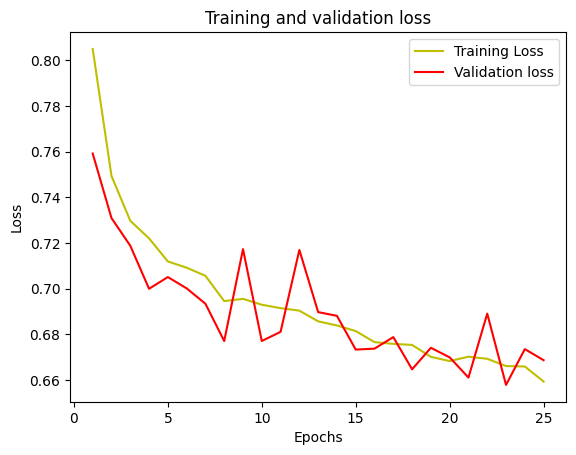

In [19]:
baseUnet: BacboneUNet = BacboneUNet("lesion_base_unet", "resnet34", "sigmoid", 0.0001, True)
results = baseUnet.train_generator(test=test, train=train_gen_resnet_34)
display_unet_loss(results)
display_unet_loss("f1-score")

In [21]:
baseUnet.save()

True

# **Tensorboard**

In [ ]:
%load_ext tensorboard

In [ ]:
%ls ./drive/MyDrive/Oral-Segmentation/logs
%tensorboard --logdir ./drive/MyDrive/Oral-Segmentation/logs

In [ ]:
%ls ./drive/MyDrive/Oral-Segmentation/logs
%tensorboard --logdir ./drive/MyDrive/Oral-Segmentation/logs_lr_change

ls: cannot access './drive/MyDrive/Oral-Segmentation/logs': No such file or directory


<IPython.core.display.Javascript object>

#**Evaluation**

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


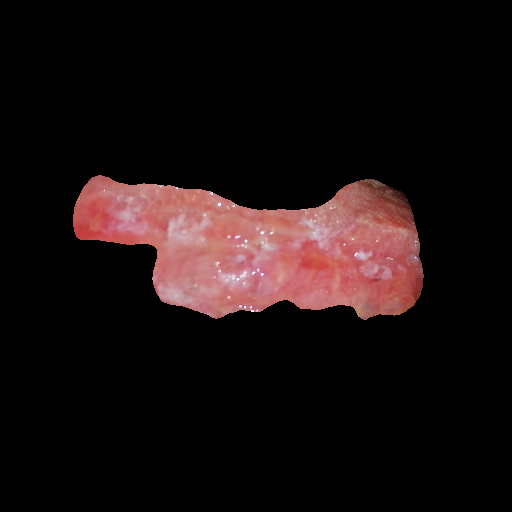

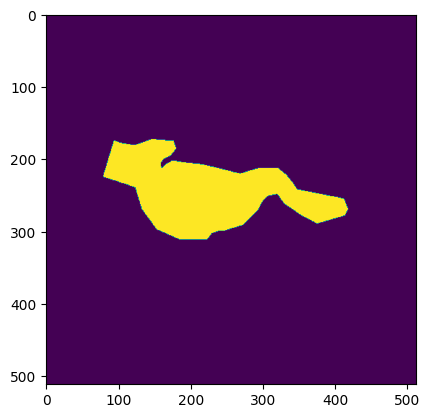

In [25]:
from google.colab.patches import cv2_imshow
from keras.models import load_model
import random

def test_model(path: str):
  model = load_model(path, compile=False)

  index = random.randint(0, len(test.images))
  img = test.images[index]
  ground_truth = test.raw_masks[index]

  img = np.expand_dims(img, 0)

  prediction = model.predict(img)
  prediction = np.argmax(prediction, axis=3)[0, :, :]

  # Create an image where the mask is overlaid on the original image and everything else is black
  masked_image = np.zeros_like(img[0])
  masked_image[prediction == 1] = img[0][prediction == 1]  # Adjust this line based on your mask values

  # Show images
  cv2_imshow(masked_image)
  plt.imshow(ground_truth)
  plt.show()


test_model("./drive/MyDrive/models/baseUnet.h5")